# 컨볼루션 신경망을 이용한 이미지 분류 실험 보고서  
(Convolutional Neural Network Image Classification Report)

- AI 이해  
- 2237004 김송희  
- 2025.11.28  

---

## 1. 실험 개요
- 본 실험의 목적은 컨볼루션 신경망(Convolutional Neural Network, CNN)을 이용하여 Food-101 이미지 데이터셋을 분류해 보고, 기본적인 CNN 구조와 하이퍼파라미터가 분류 성능에 어떤 영향을 미치는지 이해하는 것이다. Food-101 데이터셋은 101가지 음식 카테고리로 구성된 대규모 이미지 데이터셋으로, 다양한 색·형태·배경을 포함하고 있어 일반적인 이미지 분류 모델의 성능을 평가하는 데 많이 활용된다.

- 실험 환경은 Google Colab에서 진행하였으며, 하드웨어 가속기로 GPU를 사용하였다. 모델 구현에는 TensorFlow와 Keras를 사용하였다. 입력 이미지는 계산량을 줄이기 위해 가로·세로 각각 128×128 크기로 리사이즈하여 사용하였고, 배치 크기는 64, 옵티마이저는 Adam, 학습률은 0.001로 설정하였다. 에폭 수는 최대 50으로 설정하되, 과적합을 방지하기 위해 Early Stopping 기법을 함께 적용하였다.

- 이 실험을 통해 CNN의 기본 구조(합성곱·풀링·완전연결 계층)와 학습 곡선 양상(훈련/검증 정확도 및 손실 변화)을 직접 관찰하고, 단순한 CNN 구조만으로도 다중 클래스 이미지 분류 문제에 어느 정도 성능을 낼 수 있는지를 확인하고자 한다.

## 2. 데이터셋 및 전처리
- 본 실험에서 사용한 Food-101 데이터셋은 이름 그대로 101가지 음식 클래스로 구성되어 있으며, 전체 약 101,000장의 컬러 이미지로 이루어져 있다. 각 클래스마다 훈련용 이미지와 평가용 이미지가 균형 있게 포함되어 있어, 다중 클래스 분류 실험에 적합한 구조를 가진다. TensorFlow Datasets(tfds)을 통해 food101를 불러오면, 훈련과 검증으로 나뉜 데이터셋과 함께 클래스 이름 정보도 함께 제공된다.

- 전처리 과정에서는 먼저 이미지를 128×128 크기로 리사이즈하였으며, 이후 픽셀 값을 0 ~ 255 범위에서 0 ~ 1 범위로 정규화하였다. 이렇게 정규화된 이미지는 신경망이 보다 안정적으로 학습되도록 도와준다. 데이터 로딩 효율을 높이기 위해 tf.data 파이프라인을 사용하였으며, 훈련 데이터셋에 대해서는 셔플과 배치, 프리페치를 적용하였다.

- 구체적으로, 훈련 데이터는 충분한 무작위성을 확보하기 위해 버퍼 크기 1000 정도로 셔플을 수행한 뒤, 배치 크기 64로 묶어 GPU에서 병렬 연산이 가능하도록 구성하였다. 검증 데이터는 성능 평가에 사용되므로 셔플은 하지 않고, 배치만 적용하여 동일한 전처리 조건에서 모델의 일반화 성능을 확인하였다.

## 3. 모델 구조
- 본 실험에서 구현한 CNN 모델은 합성곱 계층과 풀링 계층을 여러 블록으로 쌓은 뒤, 완전연결 계층을 통해 최종 분류를 수행하는 비교적 단순한 구조를 가진다.

- 입력 계층에서는 128×128×3 크기의 RGB 이미지를 입력으로 받는다. 첫 번째 블록은 3×3 커널을 사용하는 32채널의 합성곱 계층과 2×2 맥스 풀링 계층으로 구성되어 있으며, 이후 두 번째 블록에서는 필터 수를 64로, 세 번째 블록에서는 128로, 네 번째 블록에서는 256으로 점진적으로 증가시키며 합성곱+풀링 구조를 반복하였다. 이러한 방식은 초기에는 저수준 특징(엣지, 색, 질감 등)을 추출하고, 깊어질수록 더 복잡한 고수준 특징(음식의 모양, 패턴 등)을 학습하도록 돕는다.

- 합성곱 블록을 지난 출력은 Flatten 계층을 통해 1차원 벡터로 펼친 뒤, 256 유닛을 갖는 Dense 계층과 Dropout(비율 0.5)을 적용하여 과적합을 줄이고 일반화 성능을 향상시키도록 하였다. 마지막 출력 계층은 클래스 수(101)에 해당하는 뉴런을 가지며, 소프트맥스 활성함수를 사용하여 각 음식 클래스에 대한 확률 분포를 출력한다.

- 손실 함수는 다중 클래스 분류 문제에 적합한 sparse_categorical_crossentropy를 사용하였고, 옵티마이저로는 Adam을 선택하였다. 평가지표로는 정확도를 사용하여 훈련 과정과 검증 과정에서의 성능 변화를 관찰하였다.

## 4. 실험 결과
- 본 실험에서는 최대 50 epoch으로 설정하고 학습을 진행하였으나, 검증 손실의 개선 추이를 고려했을 때 약 30 epoch 부근에서 수렴하는 양상을 보여 해당 구간까지의 결과를 중심으로 분석하였다. 학습 과정에서 기록된 훈련/검증 정확도와 손실을 그림 2에 나타내었다.

- 정확도 그래프를 보면, 초기 epoch 구간에서 훈련·검증 정확도 모두 빠르게 증가한다. 훈련 정확도는 epoch 1에서 약 0.01 수준에서 시작하여 epoch 29에서 약 0.35 정도까지 꾸준히 증가하였고, 검증 정확도는 초반에 빠르게 상승하여 epoch 10 근처에서 약 0.26~0.27에 도달한 뒤, 이후에는 완만하게 증가하면서 최종적으로 약 0.30 내외에서 수렴하는 모습을 보인다.

- 손실 그래프에서는 훈련 손실이 약 4.58에서 시작하여 epoch이 진행될수록 안정적으로 감소하여 마지막에는 약 2.6 부근까지 내려간다. 검증 손실 역시 초기에는 4.2 정도에서 빠르게 감소한 뒤, epoch 10 이후에는 약 3.0 주변에서 천천히 줄어들며, 후반부에는 큰 변화 없이 작은 범위 내에서 변동한다.

- 훈련·검증 정확도의 차이는 대략 5%p 이내로 크지 않고, 손실 곡선도 크게 벌어지지 않는 점을 고려할 때, 현재 모델은 심한 과적합보다는 데이터 복잡도에 비해 용량이 제한된 단순 CNN이 점진적으로 수렴하는 상태로 볼 수 있다. Food-101과 같이 클래스 수가 101개이고 이미지 다양성이 큰 데이터셋이라는 점을 감안하면, 약 30% 수준의 검증 정확도는 기본적인 CNN 구조에서 얻을 수 있는 무난한 성능이라고 해석할 수 있다.

## 5. 결론 및 고찰
- 본 실험에서는 Food-101 데이터셋을 대상으로 비교적 단순한 컨볼루션 신경망 구조를 설계하고, Google Colab 환경에서 GPU를 활용하여 다중 클래스 이미지 분류를 수행하였다. 입력 이미지를 128×128 크기로 축소하고, 4개의 합성곱·풀링 블록과 두 개의 완전연결 계층으로 구성된 CNN을 사용한 결과, 약 30% 내외의 검증 정확도를 얻을 수 있었다. 비록 최첨단 사전학습 기반 모델에 비하면 높은 성능이라고 보기는 어렵지만, 기본적인 CNN만으로도 고차원 이미지 데이터에서 의미 있는 수준의 분류 성능을 달성할 수 있다는 점을 확인하였다.

- 실험을 통해 학습/검증 정확도 및 손실 곡선의 변화를 직접 관찰함으로써, epoch 수가 증가할수록 훈련 성능은 계속 향상되지만 검증 성능은 일정 수준 이후 더 이상 크게 좋아지지 않는다는 사실을 확인하였다. 이는 모델 복잡도와 데이터 복잡도의 균형, 그리고 과적합을 방지하기 위한 조기 종료와 같은 기법의 필요성을 이해하는 데 도움이 되었다.

- 다만 본 실험에서는 데이터 증강, 정규화, 학습률 스케줄링과 같은 기법을 충분히 활용하지 못했고, ResNet·EfficientNet과 같은 사전학습 기반의 대형 모델도 사용하지 않았다. 향후에는 이러한 기법들을 적용하여 더 복잡한 모델을 실험해 보고, 하이퍼파라미터 탐색을 통해 배치 크기, 학습률, 드롭아웃 비율 등을 체계적으로 조정한다면 성능을 추가로 향상시킬 수 있을 것으로 기대된다. 이번 실험을 통해 CNN의 기본 구조와 학습 과정에 대한 이해를 높였으며, 실제 이미지 분류 문제에서 고려해야 할 요소들을 직접 체감해 볼 수 있었다.

In [ ]:
import tensorflow as tf
print("TensorFlow version:", tf.__version__)
print("GPU devices:", tf.config.list_physical_devices('GPU'))


TensorFlow version: 2.19.0
GPU devices: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


데이터셋을 로딩하는 중 ... (처음 실행 시 다운로드에 시간이 소요됩니다)


Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/2 [00:00<?, ? splits/s]

Generating train examples...: 0 examples [00:00, ? examples/s]

Shuffling /root/tensorflow_datasets/food101/incomplete.6V1LTB_2.0.0/food101-train.tfrecord*...:   0%|         …

Generating validation examples...: 0 examples [00:00, ? examples/s]

Shuffling /root/tensorflow_datasets/food101/incomplete.6V1LTB_2.0.0/food101-validation.tfrecord*...:   0%|    …

Dataset food101 downloaded and prepared to /root/tensorflow_datasets/food101/2.0.0. Subsequent calls will reuse this data.
훈련 데이터 크기 : 75750
테스트 데이터 크기 : 25250
클래스 수 : 101
클래스 이름 (일부) : ['apple_pie', 'baby_back_ribs', 'baklava', 'beef_carpaccio', 'beef_tartare', 'beet_salad', 'beignets', 'bibimbap', 'bread_pudding', 'breakfast_burrito']


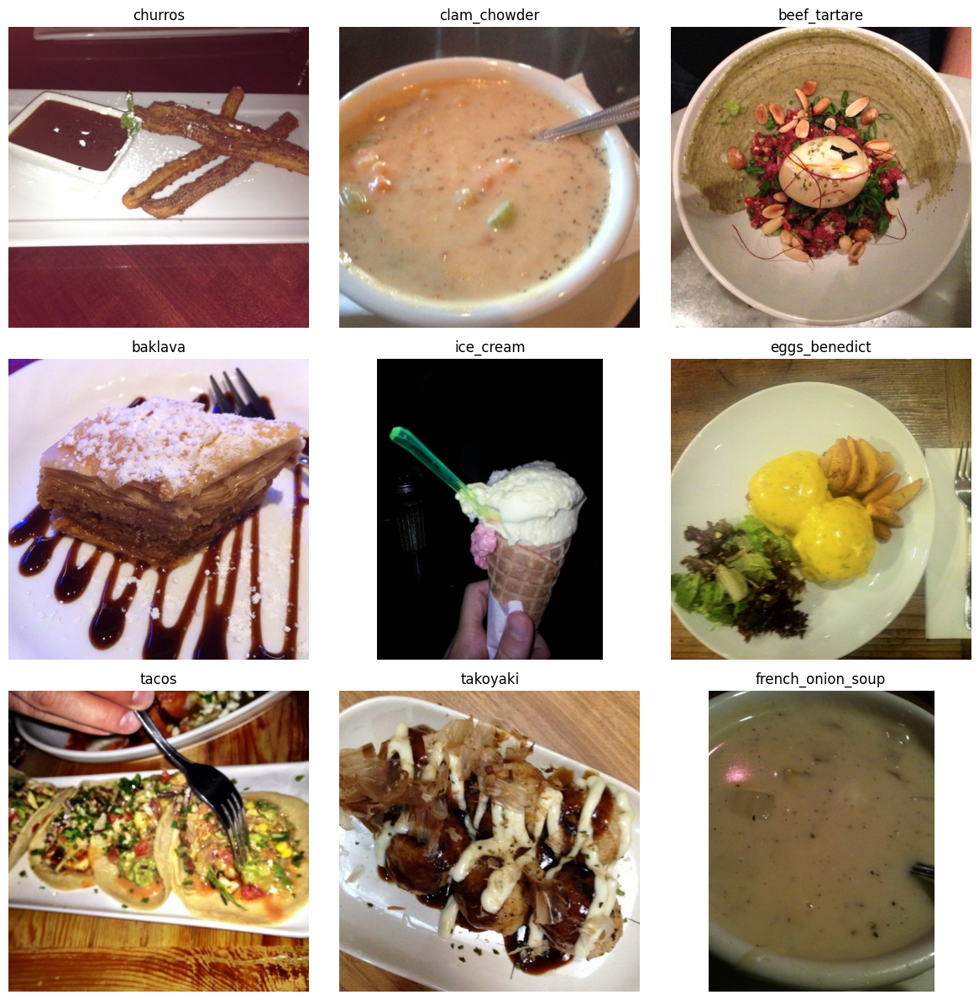

In [ ]:
import tensorflow as tf
import tensorflow_datasets as tfds
import numpy as np
import matplotlib.pyplot as plt
from tensorflow import keras

# 랜덤 시드 설정
SEED = 2454
np.random.seed(SEED)
tf.random.set_seed(SEED)

# Food-101 데이터셋 로드
print("데이터셋을 로딩하는 중 ... (처음 실행 시 다운로드에 시간이 소요됩니다)")
(ds_train, ds_test), ds_info = tfds.load(
    'food101',
    split=['train', 'validation'],
    shuffle_files=True,
    as_supervised=True,  # (image, label) 형태
    with_info=True,
)

# 데이터셋 정보 출력
print(f"훈련 데이터 크기 : {ds_info.splits['train'].num_examples}")
print(f"테스트 데이터 크기 : {ds_info.splits['validation'].num_examples}")
print(f"클래스 수 : {ds_info.features['label'].num_classes}")
print(f"클래스 이름 (일부) : {ds_info.features['label'].names[:10]}")

# 데이터 시각화 함수
def show_samples(dataset, num_samples=9):
    """데이터셋에서 샘플 이미지를 시각화합니다."""
    plt.figure(figsize=(12, 12))
    for i, (image, label) in enumerate(dataset.take(num_samples)):
        plt.subplot(3, 3, i + 1)
        plt.imshow(image.numpy())
        plt.title(ds_info.features['label'].names[label])
        plt.axis('off')
    plt.tight_layout()
    plt.show()

# 샘플 이미지 확인
show_samples(ds_train)


In [ ]:
AUTOTUNE = tf.data.AUTOTUNE
IMG_SIZE = 128
BATCH_SIZE = 64

num_classes = ds_info.features['label'].num_classes

def preprocess(image, label):
    # 크기 조정
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    # 0~1 정규화
    image = tf.cast(image, tf.float32) / 255.0
    return image, label

# 훈련 데이터 파이프라인
train_dataset = (
    ds_train
    .map(preprocess, num_parallel_calls=AUTOTUNE)
    .shuffle(1000, seed=SEED)
    .batch(BATCH_SIZE)
    .prefetch(AUTOTUNE)
)

# 검증(테스트) 데이터 파이프라인
test_dataset = (
    ds_test
    .map(preprocess, num_parallel_calls=AUTOTUNE)
    .batch(BATCH_SIZE)
    .prefetch(AUTOTUNE)
)


In [ ]:
from tensorflow.keras import layers, models

def create_cnn_model():
    model = models.Sequential([
        # Block 1
        layers.Conv2D(32, (3, 3), activation='relu', padding='same',
                      input_shape=(IMG_SIZE, IMG_SIZE, 3)),
        layers.MaxPooling2D((2, 2)),

        # Block 2
        layers.Conv2D(64, (3, 3), activation='relu', padding='same'),
        layers.MaxPooling2D((2, 2)),

        # Block 3
        layers.Conv2D(128, (3, 3), activation='relu', padding='same'),
        layers.MaxPooling2D((2, 2)),

        # Block 4 (선택, 조금 더 깊게)
        layers.Conv2D(256, (3, 3), activation='relu', padding='same'),
        layers.MaxPooling2D((2, 2)),

        layers.Flatten(),
        layers.Dropout(0.5),  # 과적합 방지
        layers.Dense(256, activation='relu'),
        layers.Dropout(0.5),
        layers.Dense(num_classes, activation='softmax')
    ])

    model.compile(
        optimizer=keras.optimizers.Adam(learning_rate=1e-3),
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )
    return model

model = create_cnn_model()
model.summary()


/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 128, 128, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 64, 64, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 32, 32, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 16, 16, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 8, 8, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 16384)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 16384)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │     4,194,560 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 101)            │        25,957 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,608,933 (17.58 MB)

 Trainable params: 4,608,933 (17.58 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
import datetime

# TensorBoard 로그 디렉토리 설정
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = keras.callbacks.TensorBoard(
    log_dir=log_dir,
    histogram_freq=1,
    write_graph=True,
    write_images=True,
    update_freq='epoch',
    profile_batch='10,20'
)

# Early Stopping (선택)
early_stopping = keras.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True
)

# ModelCheckpoint (선택)
checkpoint_callback = keras.callbacks.ModelCheckpoint(
    'best_model.keras',
    monitor='val_accuracy',
    save_best_only=True
)

print("TensorBoard 설정 완료")
print("학습 후 아래 명령으로 TensorBoard 실행 가능:")
print("%load_ext tensorboard")
print(f"%tensorboard --logdir {log_dir}")


TensorBoard 설정 완료
학습 후 아래 명령으로 TensorBoard 실행 가능:
%load_ext tensorboard
%tensorboard --logdir logs/fit/20251127-040357


In [ ]:
EPOCHS = 50

history = model.fit(
    train_dataset,
    epochs=EPOCHS,
    validation_data=test_dataset,
    callbacks=[tensorboard_callback, early_stopping, checkpoint_callback],
    verbose=1
)

# 최종 평가
test_loss, test_accuracy = model.evaluate(test_dataset)
print(f"\n최종 테스트 정확도 : {test_accuracy:.4f}")
print(f"최종 테스트 손실 : {test_loss:.4f}")


Epoch 1/50
1184/1184 ━━━━━━━━━━━━━━━━━━━━ 166s 131ms/step - accuracy: 0.0146 - loss: 4.5839 - val_accuracy: 0.0648 - val_loss: 4.2066
Epoch 2/50
1184/1184 ━━━━━━━━━━━━━━━━━━━━ 153s 128ms/step - accuracy: 0.0588 - loss: 4.2409 - val_accuracy: 0.1145 - val_loss: 3.8639
Epoch 3/50
1184/1184 ━━━━━━━━━━━━━━━━━━━━ 142s 118ms/step - accuracy: 0.0901 - loss: 4.0036 - val_accuracy: 0.1486 - val_loss: 3.6819
Epoch 4/50
1184/1184 ━━━━━━━━━━━━━━━━━━━━ 142s 119ms/step - accuracy: 0.1137 - loss: 3.8479 - val_accuracy: 0.1715 - val_loss: 3.5393
Epoch 5/50
1184/1184 ━━━━━━━━━━━━━━━━━━━━ 139s 116ms/step - accuracy: 0.1368 - loss: 3.7056 - val_accuracy: 0.2008 - val_loss: 3.3828
Epoch 6/50
1184/1184 ━━━━━━━━━━━━━━━━━━━━ 144s 120ms/step - accuracy: 0.1590 - loss: 3.5985 - val_accuracy: 0.2141 - val_loss: 3.3121
Epoch 7/50
1184/1184 ━━━━━━━━━━━━━━━━━━━━ 142s 119ms/step - accuracy: 0.1684 - loss: 3.5341 - val_accuracy: 0.2263 - val_loss: 3.2949
Epoch 8/50
1184/1184 ━━━━━━━━━━━━━━━━━━━━ 143s 118ms/step - ac

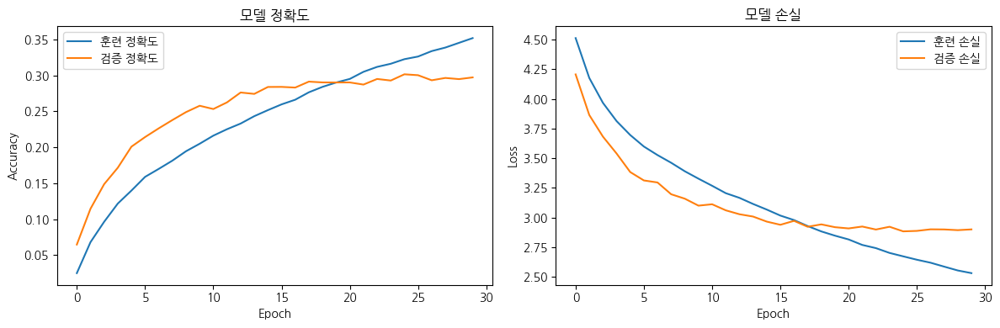

In [ ]:
plt.figure(figsize=(12, 4))

# 정확도
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='훈련 정확도')
plt.plot(history.history['val_accuracy'], label='검증 정확도')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.title('모델 정확도')

# 손실
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='훈련 손실')
plt.plot(history.history['val_loss'], label='검증 손실')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title('모델 손실')

plt.tight_layout()
plt.show()

In [ ]:
%load_ext tensorboard
%tensorboard --logdir {log_dir}

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 27958), started 0:08:38 ago. (Use '!kill 27958' to kill it.)

<IPython.core.display.Javascript object>

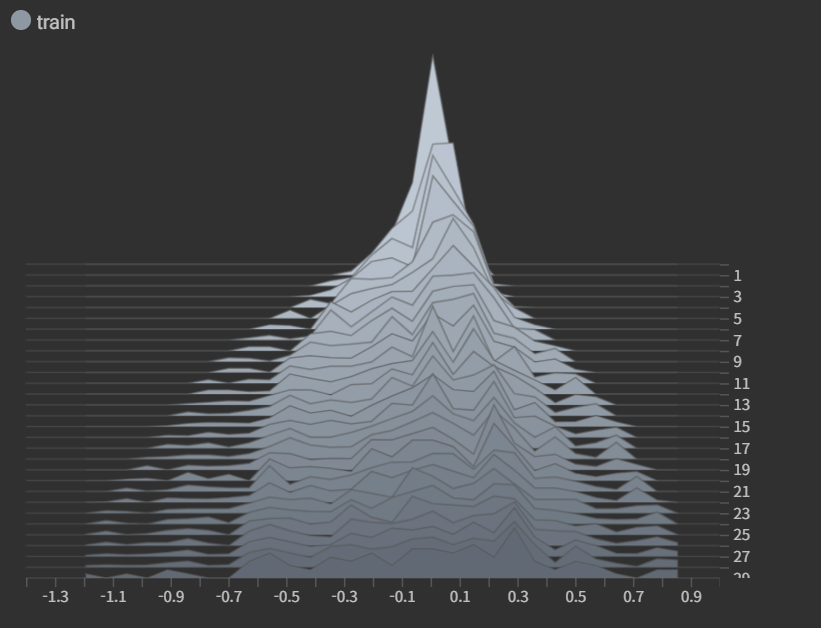

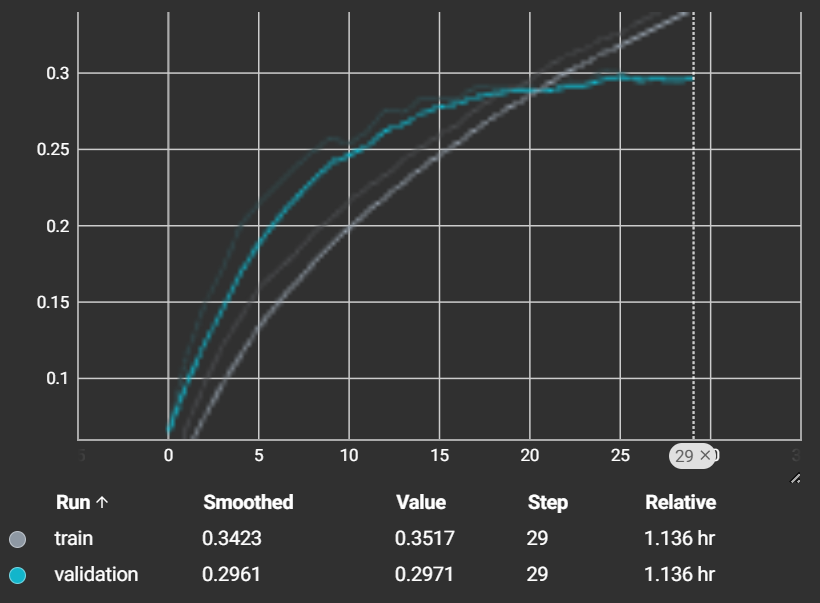